In [1]:
import s3fs
import fsspec
s3 = s3fs.S3FileSystem(anon=True)
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import boto3
from botocore import UNSIGNED
from botocore.client import Config
import io
import skimage
from PIL import Image
import scipy
from cellpose import utils, models


In [2]:
polpath = [x for x in s3.ls("s3://czb-opencell/microscopy/raw/") if "POLR2F" in x][0]


In [3]:
s3 = boto3.resource("s3", config=Config(signature_version=UNSIGNED))

bucket = s3.Bucket('czb-opencell',)
object = bucket.Object('microscopy/raw/POLR2F_ENSG00000100142/OC-FOV_POLR2F_ENSG00000100142_CID000701_FID00025277_stack.tif')
img_data = object.get().get('Body').read()
img = Image.open(io.BytesIO(img_data),mode='r',formats=["TIFF"])

In [4]:
c0 = []
c1 = []
for i in range(img.n_frames):
    img.seek(i)
    if i % 2 == 0:
        c0.append(np.array(img))
    else:
        c1.append(np.array(img))

In [5]:
np.shape(c0)

(106, 600, 600)

In [6]:
corrs = []
for i in range(img.n_frames//2):
    r,p = scipy.stats.pearsonr(np.ravel(c0[i]),np.ravel(c1[i]))
    corrs.append(r)

In [11]:
model = models.Cellpose(gpu=False, model_type='cyto')

#for i in range(img.n_frames//2):
masks, flows, styles, diams = model.eval(np.array([c0,c1]), do_3D=True, diameter=90, cellprob_threshold=0.4, channels=[0,None])

# save results so you can load in gui
# io.masks_flows_to_seg(img, masks, flows, diams, filename, chan)

# save results as png
# io.save_to_png(img, masks, flows, filename)

(14, 77) (282, 394) (195, 288)
(106, 600, 600)
63


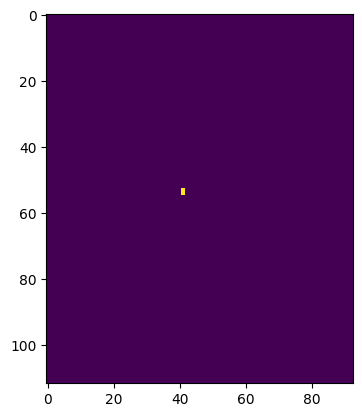

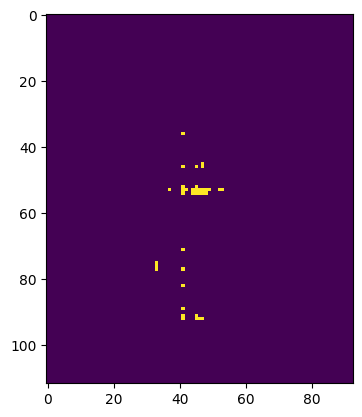

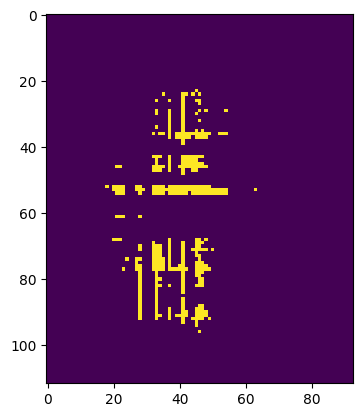

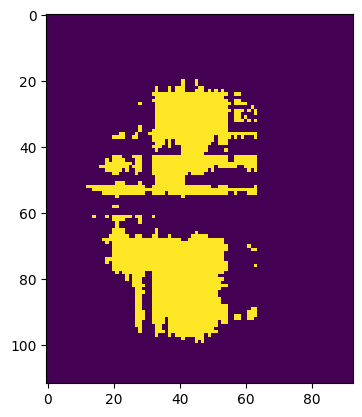

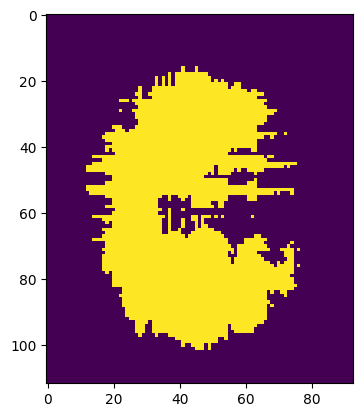

...

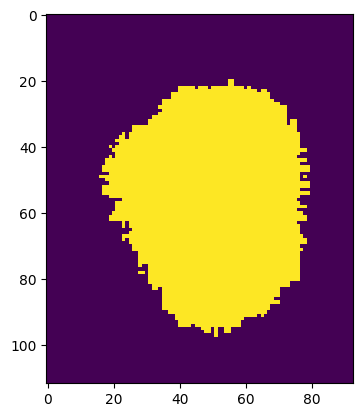

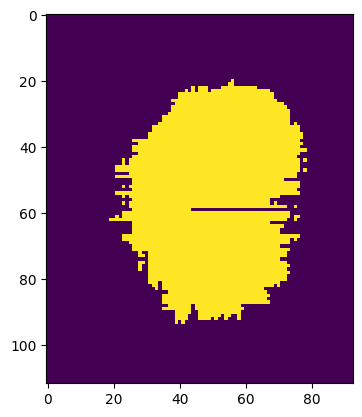

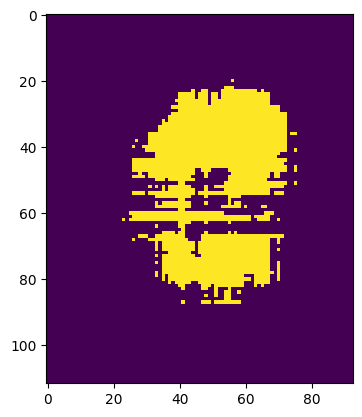

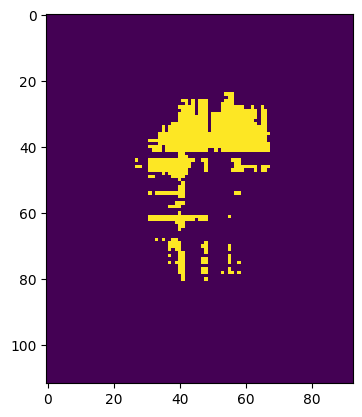

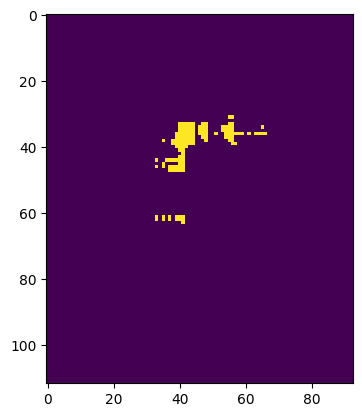

(17, 78) (284, 396) (428, 508)
(106, 600, 600)
61


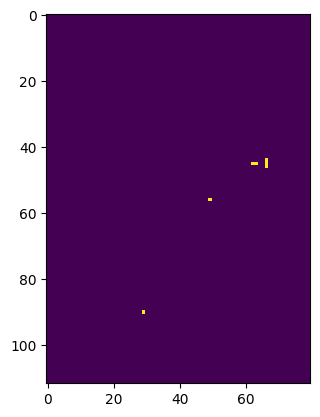

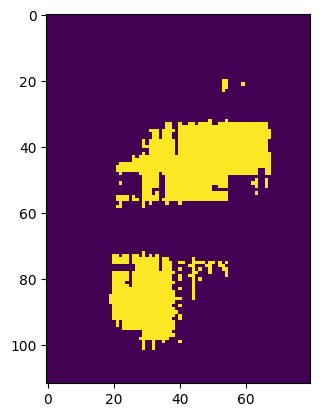

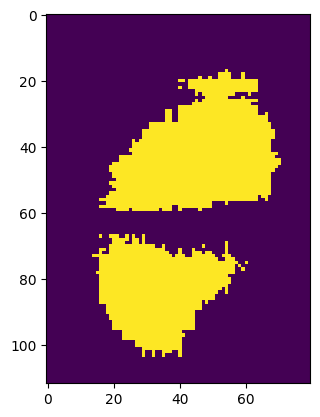

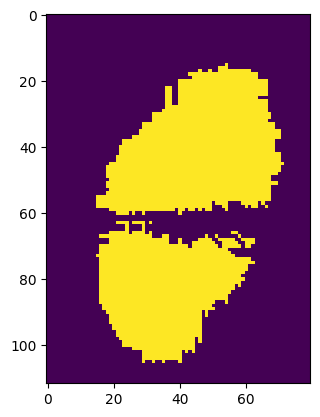

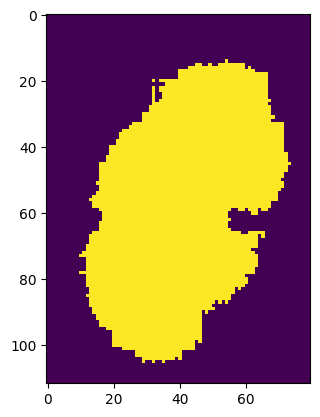

...

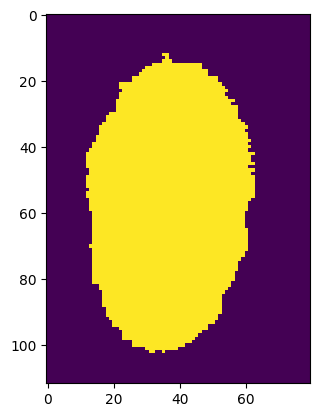

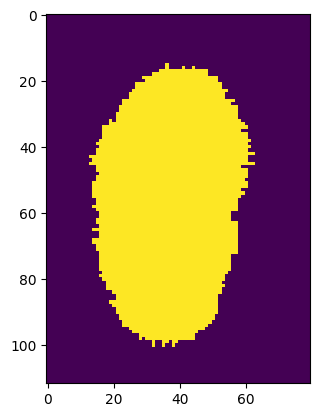

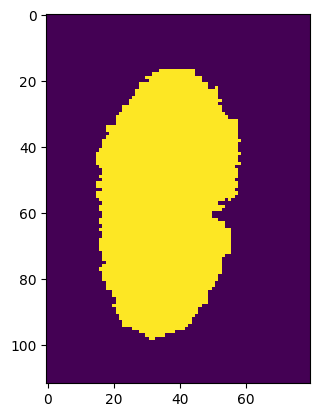

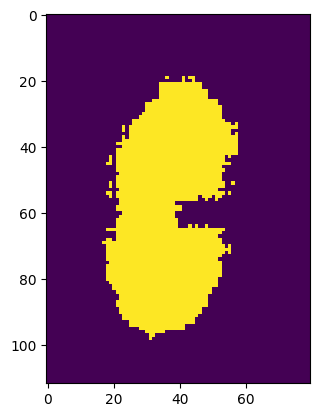

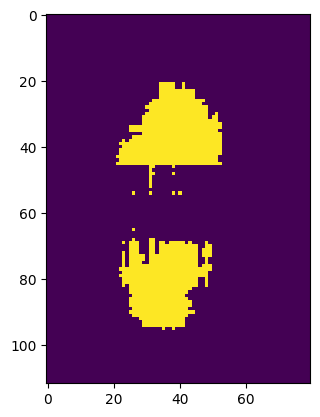

In [27]:
cell_labels = np.unique(masks)
for c in cell_labels[1:3]:
    mask = np.where(np.array(masks)==c)
    # mask is 3 x 31664317 where the first axis denotes x, y, or z
    bounds_0 = min(mask[0]), max(mask[0])
    bounds_1 = min(mask[1]), max(mask[1])
    bounds_2 = min(mask[2]), max(mask[2])
    print(bounds_0, bounds_1, bounds_2)
    cell_stack = np.array(masks[:])
    cell_stack[np.where(masks!=c)] = 0
    print(np.shape(cell_stack))
    cell_stack = cell_stack[bounds_0[0]:bounds_0[1],bounds_1[0]:bounds_1[1],bounds_2[0]:bounds_2[1]]
    print(np.shape(cell_stack)[0])
    for i in range(np.shape(cell_stack)[0]):
        plt.imshow(cell_stack[i])
        plt.show()

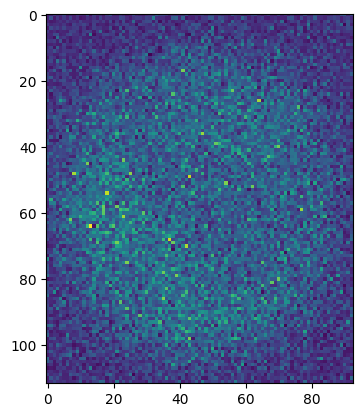

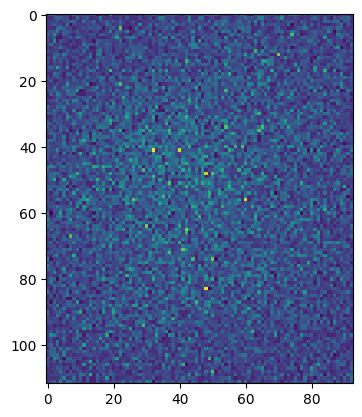

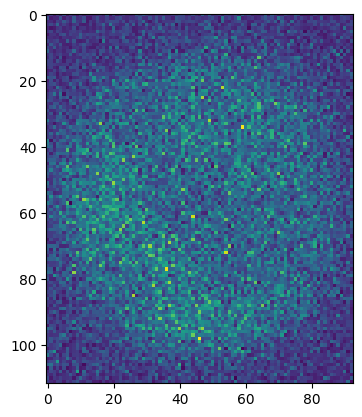

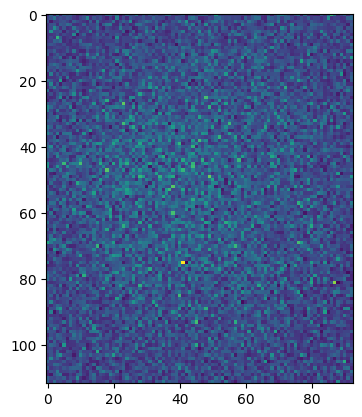

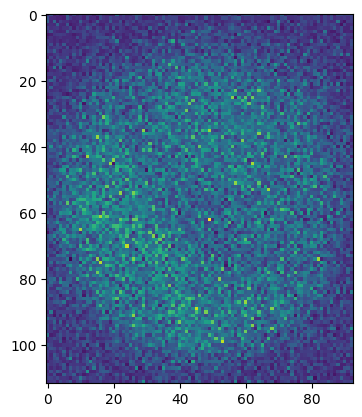

...

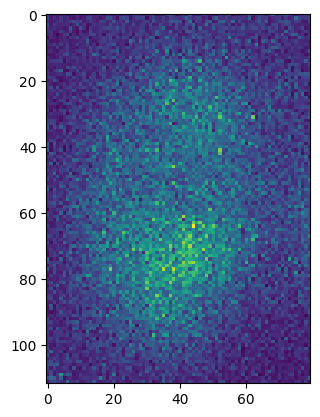

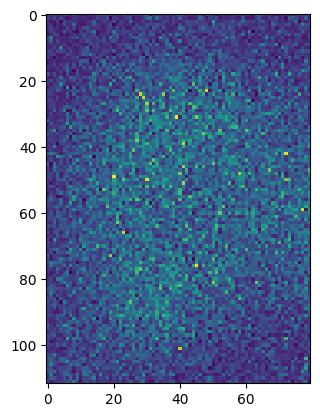

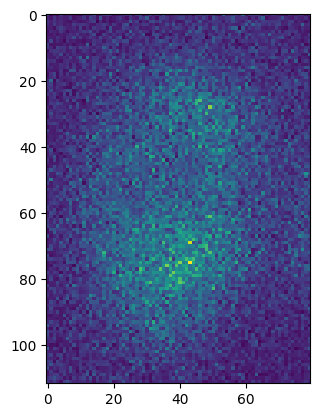

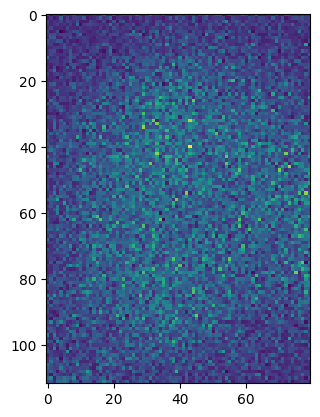

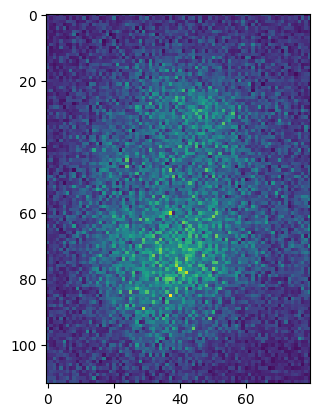

In [38]:
cell_labels = np.unique(masks)
corrs = []
array_img = np.array([c0,c1])
for c in cell_labels[1:3]:
    c_mask = np.where(np.array(masks)==c)
    bounds_0 = min(c_mask[0]), max(c_mask[0])
    bounds_1 = min(c_mask[1]), max(c_mask[1])
    bounds_2 = min(c_mask[2]), max(c_mask[2])
    
    cell_stack_mask = np.array(masks[:])
    cell_stack_mask[np.where(masks!=c)] = 0
    
    cell_stack_mask = cell_stack_mask[bounds_0[0]:bounds_0[1],bounds_1[0]:bounds_1[1],bounds_2[0]:bounds_2[1]]
    cell_stack_c0 = array_img[0][bounds_0[0]:bounds_0[1],bounds_1[0]:bounds_1[1],bounds_2[0]:bounds_2[1]]
    cell_stack_c1 = array_img[1][bounds_0[0]:bounds_0[1],bounds_1[0]:bounds_1[1],bounds_2[0]:bounds_2[1]]
    # c0_whole = []
    # c1_whole = []
    for i in range(np.shape(cell_stack_mask)[0]):
        c0_slice = np.ravel(cell_stack_c0[i])
        c1_slice = np.ravel(cell_stack_c1[i])
        mask_slice = np.ravel(cell_stack_mask[i])
        mask_pixels = np.where(mask_slice!=0)[0]
        plt.imshow(cell_stack_c0[i])
        plt.show()
        plt.imshow(cell_stack_c1[i])
        plt.show()
        if len(mask_pixels) < 2:
            continue
        #c0_whole = c0_whole + list(c0_slice)
        #c1_whole = c1_whole + list(c1_slice)
        r, p = scipy.stats.pearsonr(c0_slice[mask_pixels],c1_slice[mask_pixels]) 
        corrs.append(r)
    #r, p = scipy.stats.pearsonr(c0_whole,c1_whole)
    #corrs.append(r)

Text(0.5, 1.0, 'Hoechst vs. RNA POL2 F stain correlation per frame')

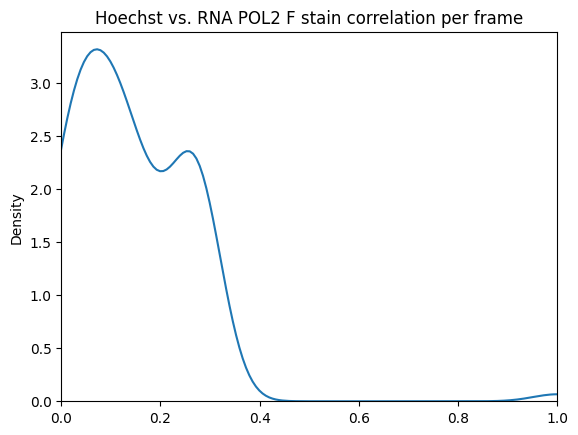

In [36]:
import seaborn as sns
sns.kdeplot(corrs)
plt.xlim(0,1)
plt.title("Hoechst vs. RNA POL2 F stain correlation per frame")